In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ad
import matplotlib.pyplot as plt
from scipy.io import mmread
from sklearn.preprocessing import normalize
import anndata as ad
import matplotlib as mpl
from harmony import harmonize
sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=8

# Read the Data

In [2]:
HCC_1N = './Adjacent/HCC-1N'
HCC_2N = './Adjacent/HCC-2N'
HCC_3N = './Adjacent/HCC-3N'
HCC_4N = './Adjacent/HCC-4N'

HCC_1L = './Leading_Edge/HCC-1L'
HCC_2L = './Leading_Edge/HCC-2L'
HCC_3L = './Leading_Edge/HCC-3L'
HCC_4L = './Leading_Edge/HCC-4L'

HCC_1T = './Primary_Tumor/HCC-1T'
HCC_2T = './Primary_Tumor/HCC-2T'
HCC_3T = './Primary_Tumor/HCC-3T'
HCC_4T = './Primary_Tumor/HCC-4T'

visium_paths = [HCC_1N, HCC_2N, HCC_3N, HCC_4N, HCC_1L, HCC_2L, HCC_3L, HCC_4L, HCC_1T, HCC_2T, HCC_3T, HCC_4T]
visium_names = ['HCC-'+ str(i + 1) + 'N-Adjacent'for i in range(4)] + \
               ['HCC-'+ str(i + 1) + 'L-Leading_Edge'for i in range(4)] + \
               ['HCC-'+ str(i + 1) + 'T-Primary_Tumor'for i in range(4)]

In [3]:
adata_l = []
adata_X = []
for i in range(12):
    adata = sc.read_visium(visium_paths[i])
    adata_l.append(adata)
    adata_X.append(adata.X.toarray())

/opt/anaconda3/envs/cello_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata_T = adata_l[8]
adata_L = adata_l[4]
adata_N = adata_l[0]

# Batch Effects Removal

In [5]:
def prepare_for_umap(adata, resolution = 0.5, n_top_genes=2000, n_comps=50, batch_effects = False, df_metadata = None):
    sc.pp.normalize_total(adata, inplace=True)
    print('Finish normalization!')
    sc.pp.log1p(adata)
    sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=n_top_genes)
    sc.pp.pca(adata, n_comps, use_highly_variable = True)
    print('Finish PCA!')
    
    if batch_effects:
        X_PCA = adata.obsm['X_pca'].copy()
        print("Processing shape: ", X_PCA.shape)
        corr_PCA = harmonize(X_PCA, df_metadata, batch_key = 'Sample ID')
        print("Finish correction!")
        adata.obsm['X_pca'] = corr_PCA
        
    sc.pp.neighbors(adata, use_rep = 'X_pca')
    sc.tl.umap(adata)
    sc.tl.leiden(adata, key_added="clusters", resolution = resolution)

In [6]:
#maybe consider use genes to directly cluster
Patient1_X = np.concatenate((adata_X[0], adata_X[4], adata_X[8]), axis = 0)
Patient1_id = [visium_names[0] for j in range(len(adata_N))] + \
[visium_names[4] for j in range(len(adata_L))] + \
[visium_names[8] for j in range(len(adata_T))]

In [7]:
Patient1_adata = ad.AnnData(X = Patient1_X, dtype=np.int32)
Patient1_adata.var_names = adata_l[0].var_names
Patient1_adata.var_names_make_unique()
Patient1_adata.obs['Sample ID'] = Patient1_id

In [9]:
Patient1_adata_with_batch = Patient1_adata.copy()

In [10]:
prepare_for_umap(Patient1_adata_with_batch, resolution = 0.3, n_top_genes=2000, n_comps=20)

Finish normalization!
Finish PCA!


2024-04-04 21:26:54.474396: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [12]:
Patient1_adata_with_batch.var["mt"] = Patient1_adata_with_batch.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(Patient1_adata_with_batch, qc_vars=["mt"], inplace=True)

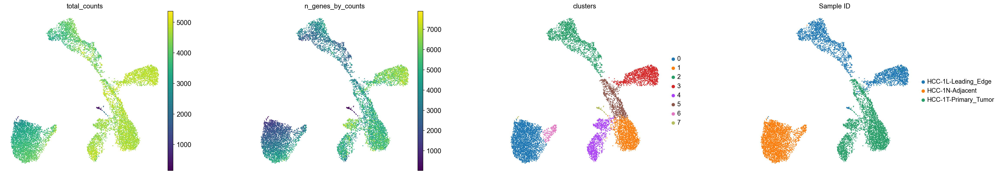

In [13]:
sc.pl.umap(Patient1_adata_with_batch, color=["total_counts", "n_genes_by_counts","clusters", "Sample ID"], wspace=0.4) 

In [8]:
prepare_for_umap(Patient1_adata, resolution = 0.3, n_top_genes=2000, n_comps=20, batch_effects = True, df_metadata = pd.DataFrame(Patient1_id, columns = ['Sample ID']))

Finish normalization!
Finish PCA!
Processing shape:  (8931, 20)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
Reach convergence after 4 iteration(s).
Finish correction!


2023-05-07 12:53:44.161939: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


# Clustering

In [9]:
HCC_N_cluster = Patient1_adata.obs['clusters'][0: len(adata_X[0])]
adata_N.obs['cluster'] = HCC_N_cluster.values
HCC_L_cluster = Patient1_adata.obs['clusters'][len(adata_X[0]): (len(adata_X[0]) + len(adata_X[4]))]
adata_L.obs['cluster'] = HCC_L_cluster.values
HCC_T_cluster = Patient1_adata.obs['clusters'][(len(adata_X[0]) + len(adata_X[4])): (len(adata_X[0]) + len(adata_X[4])+ len(adata_X[8]))]
adata_T.obs['cluster'] = HCC_T_cluster.values

In [10]:
palette={
    "0": "blue",
    "1": "red",
    "2": "yellow",
    "3": "orange",
    "4": "purple",
    "5": "brown",
    "6": "green",
    "7": "grey",
}

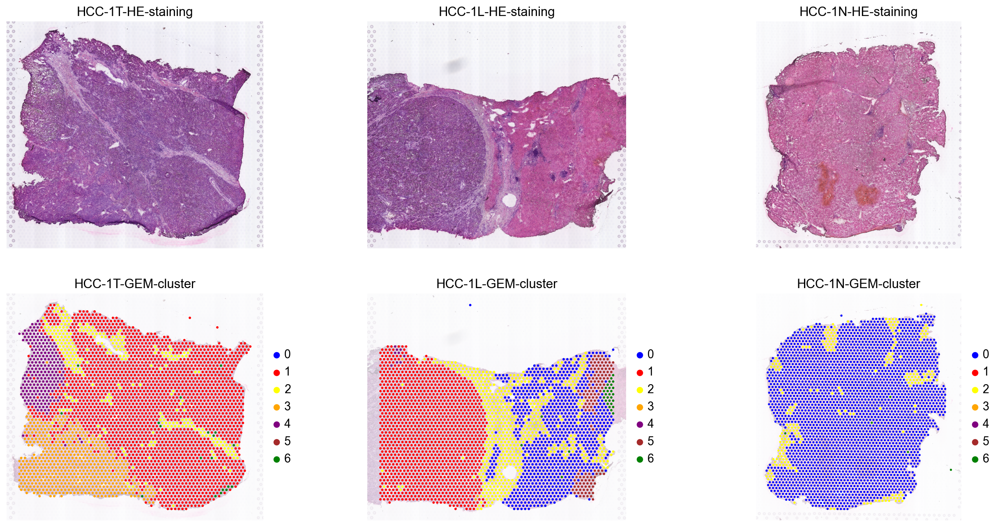

In [11]:
fig, ax = plt.subplots(2,3, figsize=(20,10))
sc.pl.spatial(adata_T, img_key="hires", alpha_img = 1, ax = ax[0, 0], show = False, title = 'HCC-1T-HE-staining')
sc.pl.spatial(adata_L, img_key="hires", alpha_img = 1, ax = ax[0, 1], show = False, title = 'HCC-1L-HE-staining')
sc.pl.spatial(adata_N, img_key="hires", alpha_img = 1, ax = ax[0, 2], show = False, title = 'HCC-1N-HE-staining')

sc.pl.spatial(adata_T, color = 'cluster', img_key="hires", alpha_img = 0.3, palette = palette, ax = ax[1, 0], show = False, title = 'HCC-1T-GEM-cluster')
sc.pl.spatial(adata_L, color = 'cluster', img_key="hires", alpha_img = 0.3, palette = palette, ax = ax[1, 1], show = False, title = 'HCC-1L-GEM-cluster')
sc.pl.spatial(adata_N, color = 'cluster', img_key="hires", alpha_img = 0.3, palette = palette, ax = ax[1, 2], show = False, title = 'HCC-1N-GEM-cluster')
plt.show()

# Invasive Frontier Labeling

In [12]:
def crop_slide(adata, left, right, up, down):
    all_corrs = adata.obsm['spatial'].copy()
    invasive_area_corrs = []

    for corr in all_corrs:
        if (left <= corr[0]) and (corr[0] <= right) and (up <= corr[1]) and (corr[1] <= down):
            invasive_area_corrs.append(corr)
    return invasive_area_corrs, all_corrs

In [13]:
def find_rows(source, target):
    return np.where((source == target).all(axis=1))[0][0]

In [14]:
def get_distance(corr1, corr2):
    return np.sum((corr1 - corr2)**2)

In [15]:
def find_neighbours(invasive_area_corrs, all_corrs):
#invasive_edge_dict stores the index of all the corrs of the invasive edge spots, 
# the key is its index among all the spots corrs of the slide. The values is the indices of the top 6 closest spots.
    invasive_area_dict = dict()

    for corr in invasive_area_corrs:
        key = find_rows(all_corrs, corr)
        invasive_area_dict[key] = []


        #calculate the distance of this corr to other corrs in the invasive_edge
        corr_dist_to_others = []
        for corr2 in invasive_area_corrs:
            corr_dist_to_others.append(get_distance(corr, corr2))


        #nearest 6 spots, exclude itself
        nearest_seven_spots = sorted(range(len(corr_dist_to_others)), key=lambda i: corr_dist_to_others[i])[1:7]

        for neighb in nearest_seven_spots:
            invasive_area_dict[key].append(find_rows(all_corrs, invasive_area_corrs[neighb]))     
        
    return invasive_area_dict

In [16]:
def find_invasive_frontier_idx(invasive_area_dict, adata):
    #S = Stromal, T = Tumor, N = Normal
    T_boundary_corr_idx = [] #tumor spots adjacent to stromal
    S_T_boundary_corr_idx = [] #stromal spots adjacent to tumor
    S_N_boundary_corr_idx = [] #stromal spots adjacent to normal
    N_boundary_corr_idx = []#normal spots adjacent to stromal
    
    for corr, neighbours in invasive_area_dict.items():
        #tumor spots adjacent to stromal
        if (adata.obs['cluster'][corr] == '1') and (np.any(adata.obs['cluster'][neighbours] == '2')):
            T_boundary_corr_idx.append(corr)
        
        #stromal spots adjacent to tumor
        if (adata.obs['cluster'][corr] == '2') and (np.any(adata.obs['cluster'][neighbours] == '1')):
            S_T_boundary_corr_idx.append(corr)
        
        #stromal spots adjacent to normal
        if (adata.obs['cluster'][corr] == '2') and (np.any(adata.obs['cluster'][neighbours] == '0')):
            S_N_boundary_corr_idx.append(corr)
        
        #normal spots adjacent to stromal
        if (adata.obs['cluster'][corr] == '0') and (np.any(adata.obs['cluster'][neighbours] == '2')):
            N_boundary_corr_idx.append(corr)
    
    adata.obs['invasive_frontier'] = 'Others'
    adata.obs['invasive_frontier'][T_boundary_corr_idx] = 'Tumor side'
    adata.obs['invasive_frontier'][S_T_boundary_corr_idx] = 'Stromal-tumor interface'
    adata.obs['invasive_frontier'][S_N_boundary_corr_idx] = 'Stromal-normal interface'
    adata.obs['invasive_frontier'][N_boundary_corr_idx] = 'Normal side'

In [17]:
def find_invasive_frontier(adata, left, right, up, down):
    invasive_edge_corrs, all_corrs = crop_slide(adata, left, right, up, down)
    invasive_edge_dict = find_neighbours(invasive_edge_corrs, all_corrs)
    find_invasive_frontier_idx(invasive_edge_dict, adata)

In [18]:
find_invasive_frontier(adata_L, 6500, 13000, 5000, 14000)

/opt/anaconda3/envs/cello_env/lib/python3.7/site-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/envs/cello_env/lib/python3.7/site-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/envs/cello_env/lib/python3.7/site-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/anaconda3/envs/cello_env/lib/python3.7/site-packag

In [19]:
edge_palette={
    'Others': 'grey',
    'Tumor side': '#FF0000',
    'Stromal-tumor interface': '#0000FF',
    'Stromal-normal interface': '#157DEC',
    'Normal side': '#FFFF00'
}

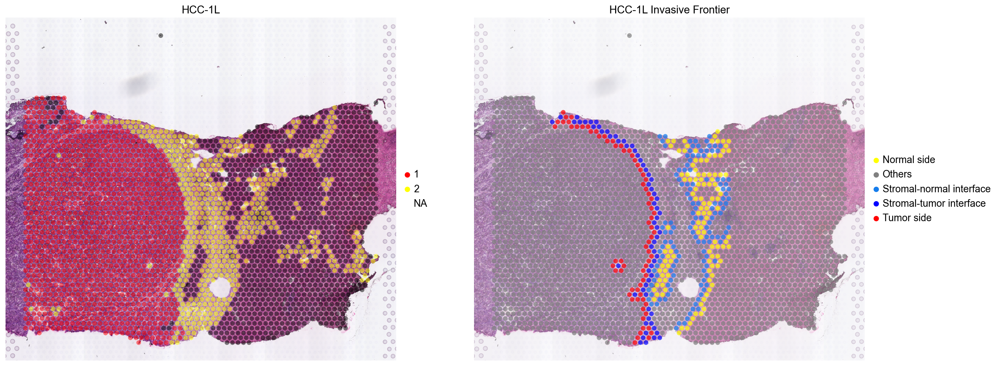

In [20]:
fig, ax = plt.subplots(1,2, figsize=(20,10))
sc.pl.spatial(adata_L, img_key="hires", color="cluster", groups=["1", "2"], 
              alpha=0.5, size=1.3, ax = ax[0], title = 'HCC-1L', show = False)

sc.pl.spatial(adata_L, img_key="hires", color="invasive_frontier", size = 1.3, alpha = 0.7,
              alpha_img=0.7, palette = edge_palette, title = 'HCC-1L Invasive Frontier', ax = ax[1], show = False)

plt.show()

In [1]:
# adata_L.write_h5ad("Patient1_L.h5ad")
# adata_T.write_h5ad("Patient1_T.h5ad")